In [ ]:
import numpy as np
from numpy import random
import matplotlib.pyplot as plt
import numpy.matlib
import pandas as pd
import seaborn as sns
import tensorflow as tf
from tensorflow import feature_column
from tensorflow.keras import layers
from sklearn.model_selection import train_test_split
import os

In [ ]:
df = pd.read_csv('/content/star_classification.csv')
cols=['obj_id','alpha','delta','ultraviolet_filter','green_filter','red_filter','near_infrared_filter','infrared_filter','run_id','rerun_id','cam_col','field_id','spec_obj_id','class','redshift','plate','MJD','fiber_id']
df.columns=cols
df = df.replace("QSO", "QSR")
display(df.head())


,obj_id,alpha,delta,ultraviolet_filter,green_filter,red_filter,near_infrared_filter,infrared_filter,run_id,rerun_id,cam_col,field_id,spec_obj_id,class,redshift,plate,MJD,fiber_id
0,1.237661e+18,135.689107,32.494632,23.87882,22.27530,20.39501,19.16573,18.79371,3606,301,2,79,6.543777e+18,GALAXY,0.634794,5812,56354,171
1,1.237665e+18,144.826101,31.274185,24.77759,22.83188,22.58444,21.16812,21.61427,4518,301,5,119,1.176014e+19,GALAXY,0.779136,10445,58158,427
2,1.237661e+18,142.188790,35.582444,25.26307,22.66389,20.60976,19.34857,18.94827,3606,301,2,120,5.152200e+18,GALAXY,0.644195,4576,55592,299
3,1.237663e+18,338.741038,-0.402828,22.13682,23.77656,21.61162,20.50454,19.25010,4192,301,3,214,1.030107e+19,GALAXY,0.932346,9149,58039,775
4,1.237680e+18,345.282593,21.183866,19.43718,17.58028,16.49747,15.97711,15.54461,8102,301,3,137,6.891865e+18,GALAXY,0.116123,6121,56187,842


--- Data Preprocessing


obj_id                  0
alpha                   0
delta                   0
ultraviolet_filter      0
green_filter            0
red_filter              0
near_infrared_filter    0
infrared_filter         0
run_id                  0
rerun_id                0
cam_col                 0
field_id                0
spec_obj_id             0
class                   0
redshift                0
plate                   0
MJD                     0
fiber_id                0
dtype: int64

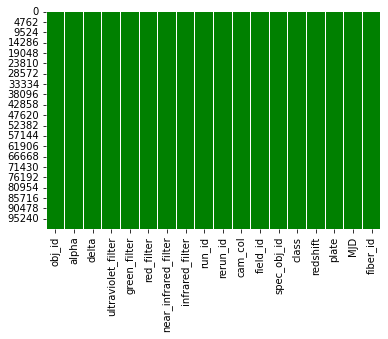

In [ ]:
#checking for the null data and heatmap the missing values
display(df.isnull().sum())
sns.heatmap(df.isnull(),cbar=False,cmap='ocean') # No missing value found

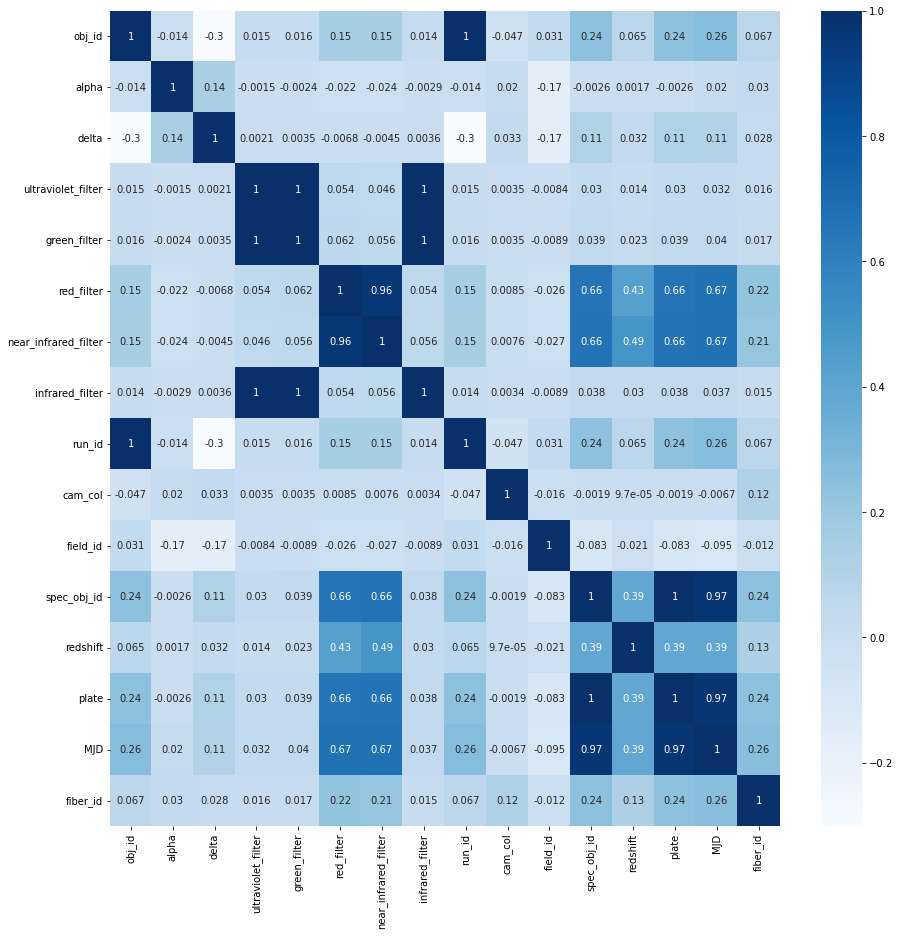

In [ ]:
# Correlation between different variables
df1=df.drop(columns=['rerun_id'])

plt.figure(figsize=(15,15))
sns.heatmap(df1.corr(),cbar=True,annot=True,cmap='Blues')

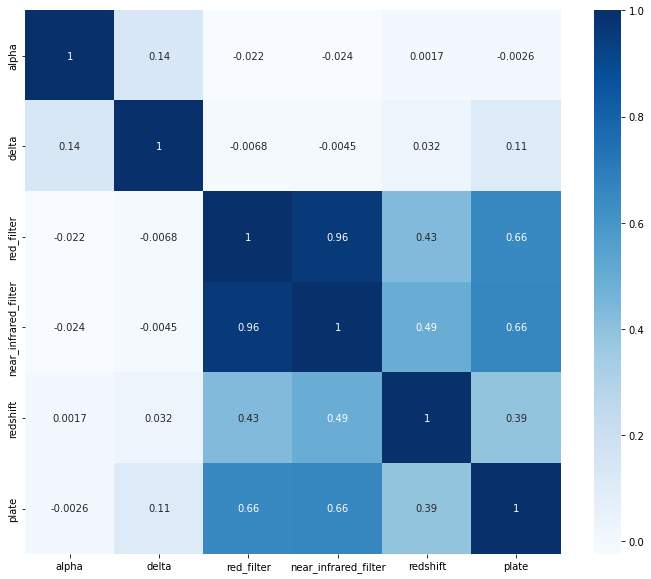

In [ ]:
df2 = df.drop(columns=['obj_id', 'run_id', 'rerun_id', 'cam_col', 'field_id', 'MJD', 'fiber_id', 'infrared_filter','spec_obj_id', 'ultraviolet_filter','green_filter' ])
plt.figure(figsize=(12,10))
sns.heatmap(df2.corr(),cbar=True,annot=True,cmap='Blues')

In [ ]:
df2['class'].value_counts()

GALAXY    59445
STAR      21594
QSR       18961
Name: class, dtype: int64

In [ ]:
def plot_violin(x, y):
    fig = plt.figure(figsize=(10, 7))
    sns.violinplot(x=x, y=y)
    plt.show()
    return

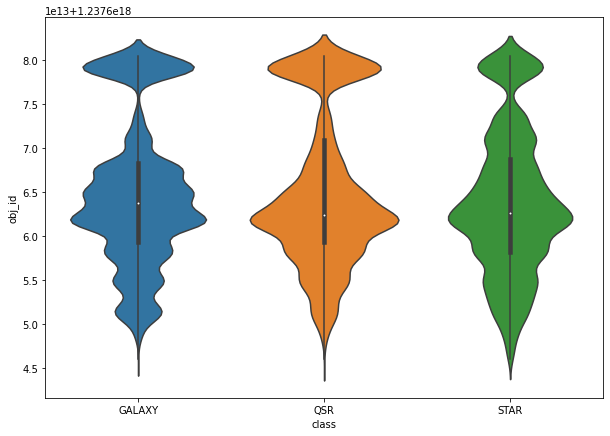

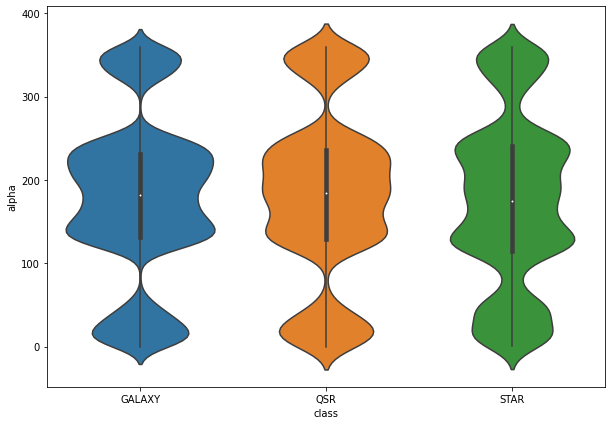

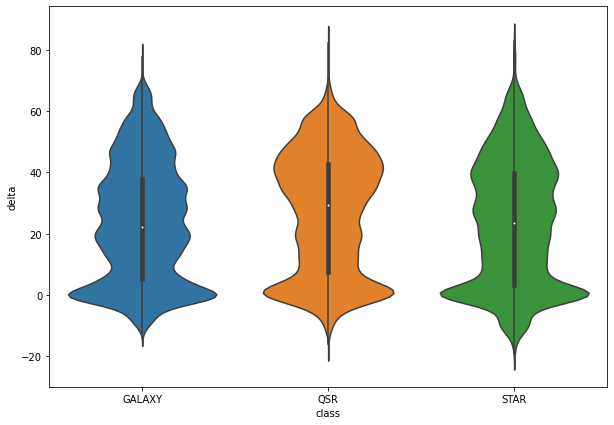

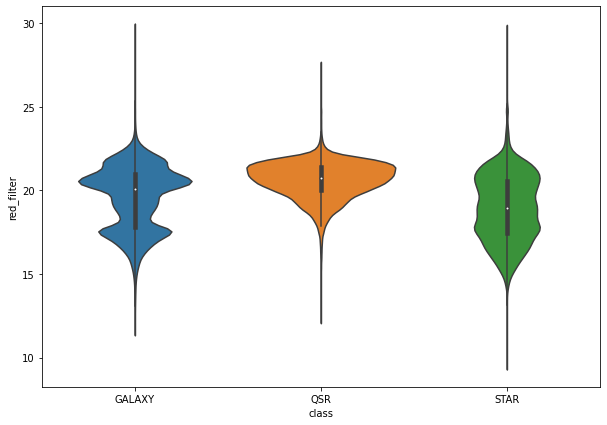

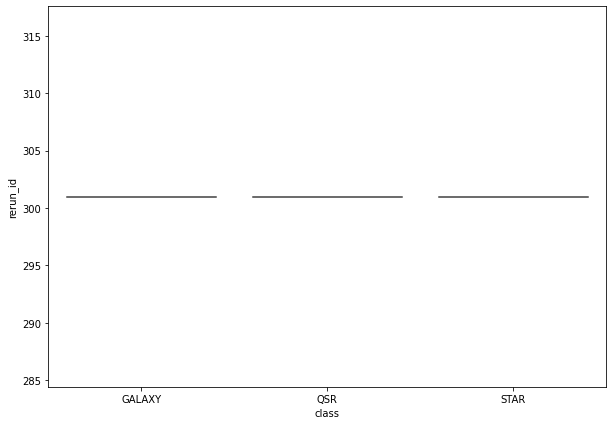

In [ ]:
plot_violin(x=df["class"], y=df["obj_id"])
plot_violin(x=df["class"], y=df["alpha"])
plot_violin(x=df["class"], y=df["delta"])
plot_violin(x=df["class"], y=df["red_filter"])
plot_violin(x=df["class"], y=df["rerun_id"])

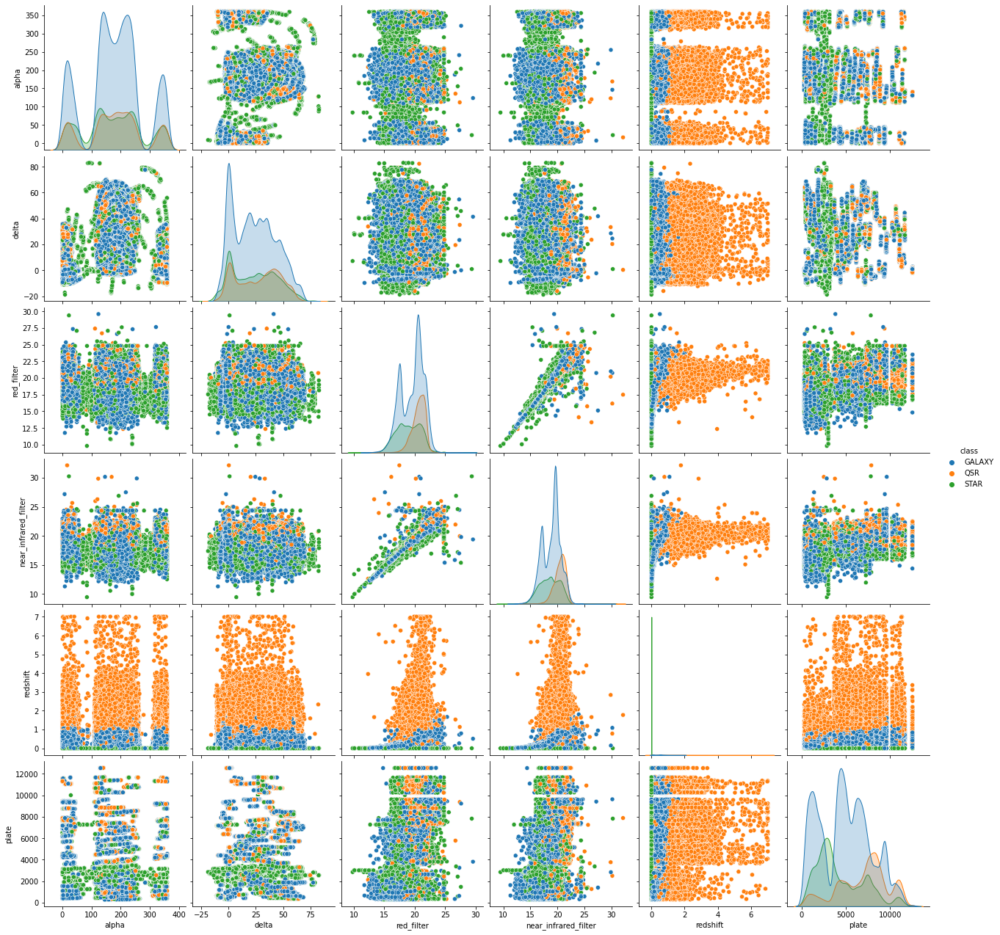

In [ ]:
sns.pairplot(df2,hue="class",height=3)
plt.show()

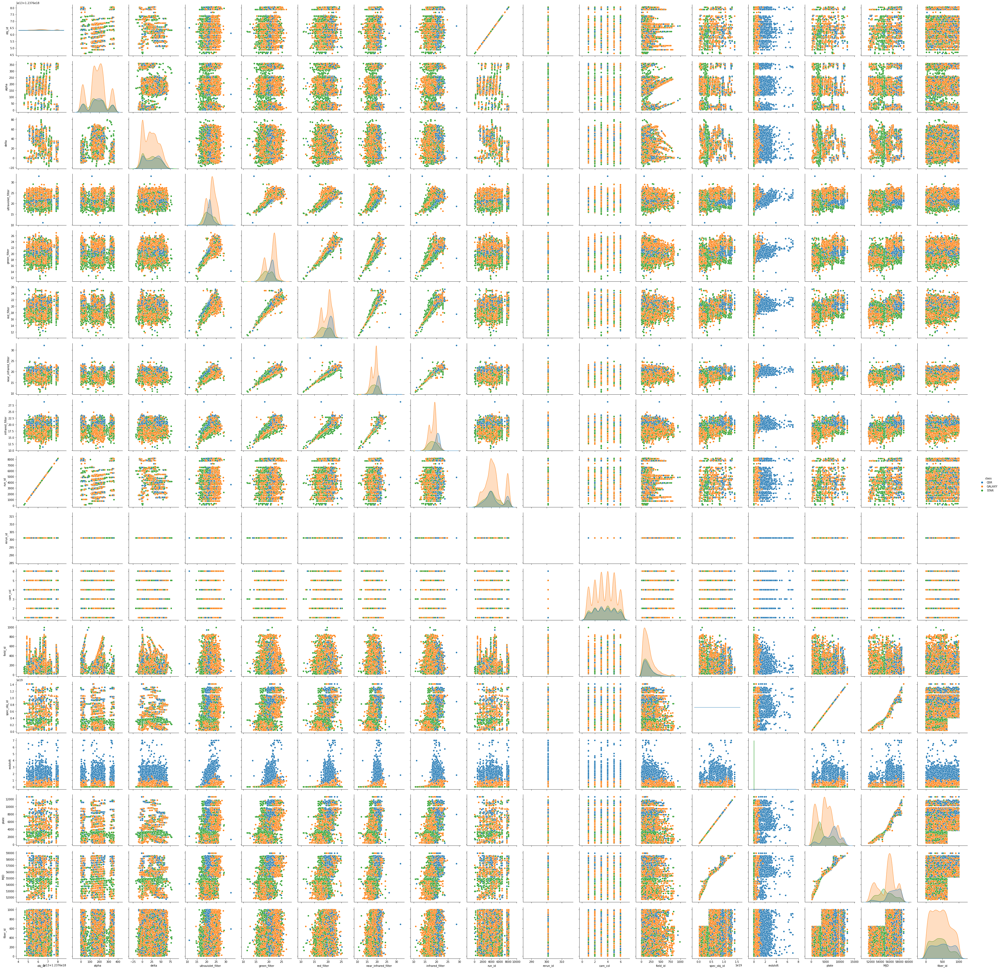

In [ ]:
sns.pairplot(df.sample(10000),hue="class",height=3)
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 18 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   obj_id                100000 non-null  float64
 1   alpha                 100000 non-null  float64
 2   delta                 100000 non-null  float64
 3   ultraviolet_filter    100000 non-null  float64
 4   green_filter          100000 non-null  float64
 5   red_filter            100000 non-null  float64
 6   near_infrared_filter  100000 non-null  float64
 7   infrared_filter       100000 non-null  float64
 8   run_id                100000 non-null  int64  
 9   rerun_id              100000 non-null  int64  
 10  cam_col               100000 non-null  int64  
 11  field_id              100000 non-null  int64  
 12  spec_obj_id           100000 non-null  float64
 13  class                 100000 non-null  object 
 14  redshift              100000 non-null  float64
 15  p

In [ ]:
df_ = df.copy()

In [ ]:
for c in df_.drop(columns=['class']).columns:
  df_[c] = df_[c] /df_[c].abs().max()

In [ ]:
df_ = pd.get_dummies(df)

In [ ]:
df.columns

Index(['obj_id', 'alpha', 'delta', 'ultraviolet_filter', 'green_filter',
       'red_filter', 'near_infrared_filter', 'infrared_filter', 'run_id',
       'rerun_id', 'cam_col', 'field_id', 'spec_obj_id', 'class', 'redshift',
       'plate', 'MJD', 'fiber_id'],
      dtype='object')

In [ ]:
df_ = df_[['alpha', 'delta', 'red_filter', 'near_infrared_filter',  'redshift', 'plate', 'class_QSR', 'class_STAR', 'class_GALAXY']]
X = df_[['alpha', 'delta', 'red_filter', 'near_infrared_filter', 'redshift', 'plate']].values
y = df_[['class_QSR', 'class_STAR', 'class_GALAXY']].values

In [ ]:
df["class"].value_counts()
#Class Imblanace - Will use SMOTE

GALAXY    59445
STAR      21594
QSR       18961
Name: class, dtype: int64

In [ ]:
X_res, y_res = X, y

In [ ]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_scaled = sc.fit(X)
X_scaled = X_scaled.transform(X)

In [ ]:
# from imblearn.over_sampling import SMOTE 
# sm = SMOTE(random_state=42)
# X_res, y_res = sm.fit_resample(X_scaled, y)
X_res, y_res = X_scaled, y

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
Xtrain, Xtest_, ytrain, ytest_ = train_test_split(X_res, y_res, random_state=0, test_size=0.3)
Xtest, Xval, ytest, yval = train_test_split(Xtest_, ytest_, random_state=0, test_size=0.3)

In [ ]:
from sklearn.preprocessing import PolynomialFeatures
poly_2 = PolynomialFeatures(degree=2, include_bias=False)

In [ ]:
from sklearn.multiclass import OneVsRestClassifier
import numpy as np
import sklearn
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import recall_score, confusion_matrix, roc_curve, auc
from sklearn.metrics import classification_report

In [ ]:
def plot_confusion_matrix(y_true, y_pred, index=['GALAXY','STAR','QSR'], columns=['GALAXY','STAR','QSR'], fig_size=(5,4)):
  cm_df = pd.DataFrame(confusion_matrix(y_true=y_true, y_pred=y_pred), index=index, columns=columns)
  plt.figure(figsize=fig_size)
  sns.heatmap(cm_df, annot=True, fmt='.5g')
  plt.title('Confusion Matrix')
  plt.ylabel('Actual Values')
  plt.xlabel('Predicted Values')
  plt.show()

def plot_roc_auc(fpr, tpr):
  sns.lineplot(fpr[0],tpr[0], color='red', linestyle='--')
  sns.lineplot(fpr[1],tpr[1], color='green', linestyle='--')
  sns.lineplot(fpr[2],tpr[2], color='blue', linestyle='--')
  sns.lineplot(fpr["macro"],tpr["macro"], color='purple')
  sns.lineplot(fpr["micro"],tpr["micro"], color='cyan')
  plt.legend(labels=["GALAXY vs rest", "STAR vs rest", "QSR vs rest", "macro", "micro"])
  return [auc(fpr[0],tpr[0]), auc(fpr[1],tpr[1]), auc(fpr[2],tpr[2]), auc(fpr["macro"],tpr["macro"]), auc(fpr["micro"],tpr["micro"])]
  
def one_vs_rest(classifier, Xtrain, ytrain, Xval):
  model = OneVsRestClassifier(classifier).fit(Xtrain, ytrain)
  y_pred = model.predict(Xval)
  return model, y_pred

In [ ]:
def RF(Xtrain, ytrain, Xval, yval, n_estimators, max_depth, n_jobs, poly_feature_obj=False):
  if poly_feature_obj != False:
    Xtrain = poly_feature_obj.fit_transform(Xtrain)
    Xtrain = sc.fit_transform(Xtrain)
    Xval = poly_feature_obj.fit_transform(Xval)
    Xval = sc.fit_transform(Xval)
  rf_model, rf_y_pred = one_vs_rest(RandomForestClassifier(n_estimators=n_estimators, criterion='entropy', max_depth=max_depth, max_features='auto', n_jobs=n_jobs, random_state=0, class_weight='balanced'), Xtrain, ytrain, Xval)
  fpr, tpr = dict(), dict()
  roc_auc = dict()
  for i in range(3):
    fpr[i], tpr[i], _ = roc_curve(yval[:, i], rf_model.predict_proba(Xval)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
  all_fpr = np.unique(np.concatenate([fpr[i] for i in range(3)]))
  mean_tpr = np.zeros_like(all_fpr)
  for i in range(3):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
  mean_tpr = mean_tpr / 3
  fpr["macro"] = all_fpr
  tpr["macro"] = mean_tpr
  roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
  # Compute micro-average ROC curve and ROC area
  fpr["micro"], tpr["micro"], _ = roc_curve(yval.ravel(), rf_model.predict_proba(Xval).ravel())
  roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
  score = rf_model.score(Xval, yval)
  score_train = rf_model.score(Xtrain, ytrain)
  return {"rf_model":rf_model, "rf_y_pred":rf_y_pred, "fpr":fpr, "tpr":tpr, "roc_auc":roc_auc, "score":score, "score_train":score_train}

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

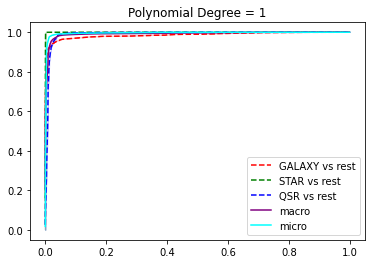

AUC (GALAXY vs rest)=  0.985963828931088
AUC (STAR vs rest)=  0.9998709330595922
AUC (QSR vs rest)=  0.9908054704987123
AUC (macro avg)=  0.9922532735852603
AUC (micro avg)=  0.996393012345679


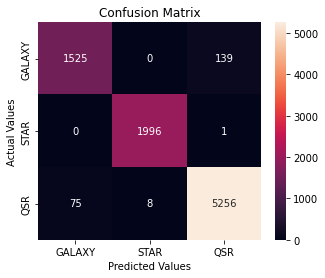

Train Accuracy =  0.974
Validation Accuracy = 0.9711111111111111
              precision    recall  f1-score   support

           0       0.95      0.92      0.94      1664
           1       1.00      1.00      1.00      1997
           2       0.97      0.99      0.98      5339

   micro avg       0.97      0.98      0.97      9000
   macro avg       0.97      0.97      0.97      9000
weighted avg       0.97      0.98      0.97      9000
 samples avg       0.97      0.98      0.98      9000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/

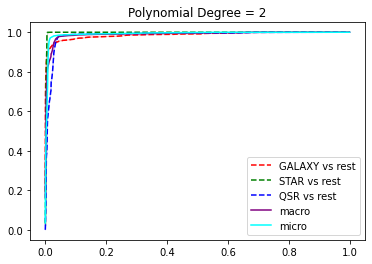

AUC (GALAXY vs rest)=  0.9868396304315913
AUC (STAR vs rest)=  0.998014085243244
AUC (QSR vs rest)=  0.9839077187808357
AUC (macro avg)=  0.9896445607201726
AUC (micro avg)=  0.9922109506172839


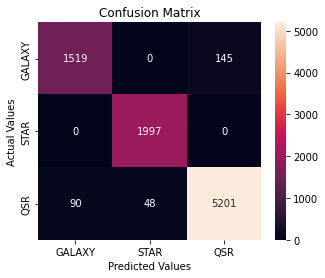

Train Accuracy =  0.9755142857142857
Validation Accuracy = 0.9657777777777777
              precision    recall  f1-score   support

           0       0.94      0.91      0.93      1664
           1       0.98      1.00      0.99      1997
           2       0.97      0.98      0.97      5339

   micro avg       0.97      0.97      0.97      9000
   macro avg       0.96      0.96      0.96      9000
weighted avg       0.97      0.97      0.97      9000
 samples avg       0.97      0.97      0.97      9000



In [ ]:
ret_values_rf = []
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

ret_values_rf.append(RF(Xtrain, ytrain, Xval, yval, n_estimators=500, max_depth=10, n_jobs=5))
auc_ = plot_roc_auc(ret_values_rf[0]["fpr"],ret_values_rf[0]["tpr"])
plt.title("Polynomial Degree = 1")
plt.show()
print("AUC (GALAXY vs rest)= ", auc_[0])
print("AUC (STAR vs rest)= ", auc_[1])
print("AUC (QSR vs rest)= ", auc_[2])
print("AUC (macro avg)= ", auc_[3])
print("AUC (micro avg)= ", auc_[4])
plot_confusion_matrix(y_true=yval.argmax(axis=1), y_pred=ret_values_rf[0]["rf_y_pred"].argmax(axis=1))
print("Train Accuracy = ", ret_values_rf[0]["score_train"])
print("Validation Accuracy =", ret_values_rf[0]["score"])
print(classification_report(y_true=yval, y_pred=ret_values_rf[0]["rf_y_pred"]))

ret_values_rf.append(RF(Xtrain, ytrain, Xval, yval, n_estimators=500, max_depth=10, n_jobs=5, poly_feature_obj=poly_2))
auc_ = plot_roc_auc(ret_values_rf[1]["fpr"],ret_values_rf[1]["tpr"])
plt.title("Polynomial Degree = 2")
plt.show()
print("AUC (GALAXY vs rest)= ", auc_[0])
print("AUC (STAR vs rest)= ", auc_[1])
print("AUC (QSR vs rest)= ", auc_[2])
print("AUC (macro avg)= ", auc_[3])
print("AUC (micro avg)= ", auc_[4])
plot_confusion_matrix(y_true=yval.argmax(axis=1), y_pred=ret_values_rf[1]["rf_y_pred"].argmax(axis=1))
print("Train Accuracy = ", ret_values_rf[1]["score_train"])
print("Validation Accuracy =", ret_values_rf[1]["score"])
print(classification_report(y_true=yval, y_pred=ret_values_rf[1]["rf_y_pred"]))

In [ ]:
import pickle
with open('ret_values_rf', 'wb') as f:
    pickle.dump(ret_values_rf, f)

In [ ]:
from sklearn.naive_bayes import GaussianNB
def NB(Xtrain, ytrain, Xval, yval, poly_feature_obj=False):
  if poly_feature_obj != False:
    Xtrain = poly_feature_obj.fit_transform(Xtrain)
    Xtrain = sc.fit_transform(Xtrain)
    Xval = poly_feature_obj.fit_transform(Xval)
    Xval = sc.fit_transform(Xval)
  nb_model, nb_y_pred = one_vs_rest(GaussianNB(), Xtrain, ytrain, Xval)
  fpr, tpr = dict(), dict()
  roc_auc = dict()
  for i in range(3):
    fpr[i], tpr[i], _ = roc_curve(yval[:, i], nb_model.predict_proba(Xval)[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
  all_fpr = np.unique(np.concatenate([fpr[i] for i in range(3)]))
  mean_tpr = np.zeros_like(all_fpr)
  for i in range(3):
    mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
  mean_tpr = mean_tpr / 3
  fpr["macro"] = all_fpr
  tpr["macro"] = mean_tpr
  roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
  # Compute micro-average ROC curve and ROC area
  fpr["micro"], tpr["micro"], _ = roc_curve(yval.ravel(), nb_model.predict_proba(Xval).ravel())
  roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
  score = nb_model.score(Xval, yval)
  score_train = nb_model.score(Xtrain, ytrain)
  return {"nb_model":nb_model, "nb_y_pred":nb_y_pred, "fpr":fpr, "tpr":tpr, "roc_auc":roc_auc, "score":score, "score_train":score_train}

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

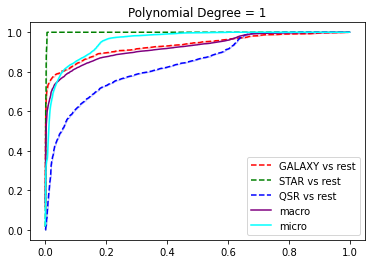

AUC (GALAXY vs rest)=  0.933609888143822
AUC (STAR vs rest)=  0.9982681433259414
AUC (QSR vs rest)=  0.8379950781944553
AUC (macro avg)=  0.9233903617252104
AUC (micro avg)=  0.9585020308641975


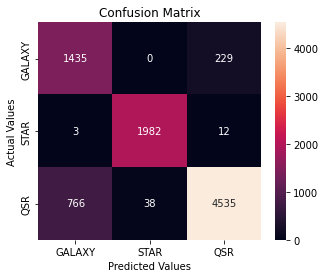

Train Accuracy =  0.6750142857142857
Validation Accuracy = 0.6622222222222223
              precision    recall  f1-score   support

           0       0.65      0.84      0.74      1664
           1       0.98      0.99      0.99      1997
           2       0.69      0.91      0.79      5339

   micro avg       0.74      0.92      0.82      9000
   macro avg       0.77      0.92      0.84      9000
weighted avg       0.75      0.92      0.82      9000
 samples avg       0.79      0.92      0.83      9000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/

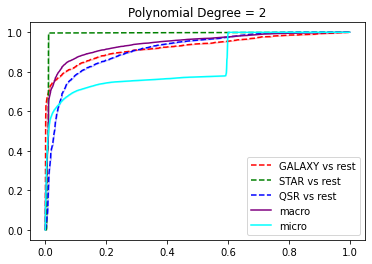

AUC (GALAXY vs rest)=  0.9250208730916031
AUC (STAR vs rest)=  0.9907248778351019
AUC (QSR vs rest)=  0.91116561024848
AUC (macro avg)=  0.9424032081229394
AUC (micro avg)=  0.8397850061728396


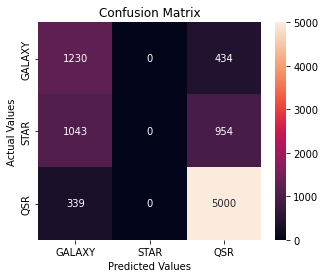

Train Accuracy =  0.7901428571428571
Validation Accuracy = 0.6853333333333333
              precision    recall  f1-score   support

           0       0.92      0.71      0.80      1664
           1       0.00      0.00      0.00      1997
           2       0.78      0.94      0.85      5339

   micro avg       0.81      0.69      0.74      9000
   macro avg       0.57      0.55      0.55      9000
weighted avg       0.63      0.69      0.65      9000
 samples avg       0.69      0.69      0.69      9000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.naive_bayes import GaussianNB
ret_values_nb = []
ret_values_nb.append(NB(Xtrain, ytrain, Xval, yval))

from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
auc_ = plot_roc_auc(ret_values_nb[0]["fpr"],ret_values_nb[0]["tpr"])
plt.title("Polynomial Degree = 1")
plt.show()
print("AUC (GALAXY vs rest)= ", auc_[0])
print("AUC (STAR vs rest)= ", auc_[1])
print("AUC (QSR vs rest)= ", auc_[2])
print("AUC (macro avg)= ", auc_[3])
print("AUC (micro avg)= ", auc_[4])
plot_confusion_matrix(y_true=yval.argmax(axis=1), y_pred=ret_values_nb[0]["nb_y_pred"].argmax(axis=1))
print("Train Accuracy = ", ret_values_nb[0]["score_train"])
print("Validation Accuracy =", ret_values_nb[0]["score"])
print(classification_report(y_true=yval, y_pred=ret_values_nb[0]["nb_y_pred"]))

ret_values_nb.append(NB(Xtrain, ytrain, Xval, yval, poly_feature_obj=poly_2))
auc_ = plot_roc_auc(ret_values_nb[1]["fpr"],ret_values_nb[1]["tpr"])
plt.title("Polynomial Degree = 2")
plt.show()
print("AUC (GALAXY vs rest)= ", auc_[0])
print("AUC (STAR vs rest)= ", auc_[1])
print("AUC (QSR vs rest)= ", auc_[2])
print("AUC (macro avg)= ", auc_[3])
print("AUC (micro avg)= ", auc_[4])
plot_confusion_matrix(y_true=yval.argmax(axis=1), y_pred=ret_values_nb[1]["nb_y_pred"].argmax(axis=1))
print("Train Accuracy = ", ret_values_nb[1]["score_train"])
print("Validation Accuracy =", ret_values_nb[1]["score"])
print(classification_report(y_true=yval, y_pred=ret_values_nb[1]["nb_y_pred"]))

In [ ]:
import pickle
with open('ret_values_nb', 'wb') as f:
    pickle.dump(ret_values_nb, f)

In [ ]:
from xgboost import XGBClassifier
from sklearn.metrics import mean_squared_error
def xgb_model(Xtrain, ytrain, Xval, yval, poly_feature_obj=False):
    if poly_feature_obj != False:
      Xtrain = poly_feature_obj.fit_transform(Xtrain)
      Xtrain = sc.fit_transform(Xtrain)
      Xval = poly_feature_obj.fit_transform(Xval)
      Xval = sc.fit_transform(Xval)
    classifier = XGBClassifier(objective ='reg:squarederror', colsample_bytree = 0.3, learning_rate = 0.1,max_depth = 5, alpha = 10, n_estimators = 10, class_weights='balanced')
    xgb_model, xgb_y_pred=one_vs_rest(classifier, Xtrain, ytrain, Xval)
    fpr, tpr = dict(), dict()
    roc_auc = dict()
    for i in range(3):
      fpr[i], tpr[i], _ = roc_curve(yval[:, i], xgb_model.predict_proba(Xval)[:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(3)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(3):
      mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr = mean_tpr / 3
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
  # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(yval.ravel(), xgb_model.predict_proba(Xval).ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    score = xgb_model.score(Xval, yval)
    score_train = xgb_model.score(Xtrain, ytrain)
    return {"xgb_model":xgb_model, "xgb_y_pred":xgb_y_pred, "fpr":fpr, "tpr":tpr, "roc_auc":roc_auc, "score":score, "score_train":score_train}

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

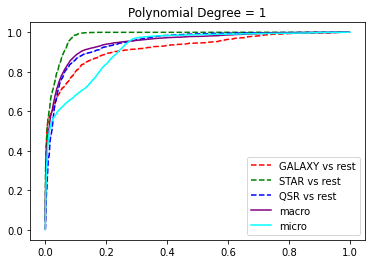

AUC (GALAXY vs rest)=  0.9205198055165255
AUC (STAR vs rest)=  0.9806719575293256
AUC (QSR vs rest)=  0.9457566655696009
AUC (macro avg)=  0.9490250790924408
AUC (micro avg)=  0.9185004969135803


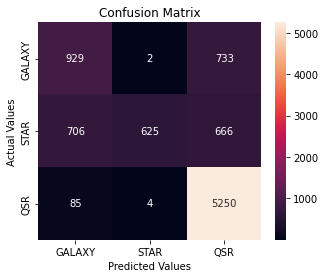

Train Accuracy =  0.6505571428571428
Validation Accuracy = 0.6527777777777778
              precision    recall  f1-score   support

           0       0.94      0.02      0.04      1664
           1       0.99      0.31      0.48      1997
           2       0.79      0.98      0.87      5339

   micro avg       0.80      0.66      0.72      9000
   macro avg       0.91      0.44      0.46      9000
weighted avg       0.86      0.66      0.63      9000
 samples avg       0.65      0.66      0.66      9000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/

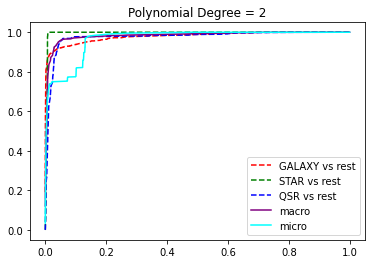

AUC (GALAXY vs rest)=  0.9792813266766629
AUC (STAR vs rest)=  0.9955160857808203
AUC (QSR vs rest)=  0.9754519052133166
AUC (macro avg)=  0.983451795886571
AUC (micro avg)=  0.9661652993827161


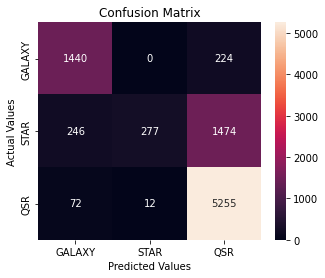

Train Accuracy =  0.9633857142857143
Validation Accuracy = 0.7712222222222223
              precision    recall  f1-score   support

           0       0.96      0.86      0.91      1664
           1       0.96      0.14      0.24      1997
           2       0.75      0.99      0.85      5339

   micro avg       0.80      0.78      0.79      9000
   macro avg       0.89      0.66      0.67      9000
weighted avg       0.84      0.78      0.73      9000
 samples avg       0.77      0.78      0.77      9000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from xgboost import XGBClassifier
ret_values_xgb = []
ret_values_xgb.append(xgb_model(Xtrain, ytrain, Xval, yval))

auc_ = plot_roc_auc(ret_values_xgb[0]["fpr"],ret_values_xgb[0]["tpr"])
plt.title("Polynomial Degree = 1")
plt.show()
print("AUC (GALAXY vs rest)= ", auc_[0])
print("AUC (STAR vs rest)= ", auc_[1])
print("AUC (QSR vs rest)= ", auc_[2])
print("AUC (macro avg)= ", auc_[3])
print("AUC (micro avg)= ", auc_[4])
plot_confusion_matrix(y_true=yval.argmax(axis=1), y_pred=ret_values_xgb[0]["xgb_y_pred"].argmax(axis=1))
print("Train Accuracy = ", ret_values_xgb[0]["score_train"])
print("Validation Accuracy =", ret_values_xgb[0]["score"])
print(classification_report(y_true=yval, y_pred=ret_values_xgb[0]["xgb_y_pred"]))

ret_values_xgb.append(xgb_model(Xtrain, ytrain, Xval, yval, poly_feature_obj=poly_2))
auc_ = plot_roc_auc(ret_values_xgb[1]["fpr"],ret_values_xgb[1]["tpr"])
plt.title("Polynomial Degree = 2")
plt.show()
print("AUC (GALAXY vs rest)= ", auc_[0])
print("AUC (STAR vs rest)= ", auc_[1])
print("AUC (QSR vs rest)= ", auc_[2])
print("AUC (macro avg)= ", auc_[3])
print("AUC (micro avg)= ", auc_[4])
plot_confusion_matrix(y_true=yval.argmax(axis=1), y_pred=ret_values_xgb[1]["xgb_y_pred"].argmax(axis=1))
print("Train Accuracy = ", ret_values_xgb[1]["score_train"])
print("Validation Accuracy =", ret_values_xgb[1]["score"])
print(classification_report(y_true=yval, y_pred=ret_values_xgb[1]["xgb_y_pred"]))

In [ ]:
import pickle
with open('ret_values_xgb', 'wb') as f:
    pickle.dump(ret_values_xgb, f)

In [ ]:
from sklearn.tree import DecisionTreeClassifier

def DT(Xtrain, ytrain, Xval, yval, poly_feature_obj=False):
    if poly_feature_obj != False:
      Xtrain = poly_feature_obj.fit_transform(Xtrain)
      Xtrain = sc.fit_transform(Xtrain)
      Xval = poly_feature_obj.fit_transform(Xval)
      Xval = sc.fit_transform(Xval)   
    classifier = DecisionTreeClassifier(max_depth=10, criterion='gini', random_state=0, class_weight='balanced')
    dt_model, dt_y_pred = one_vs_rest(classifier, Xtrain, ytrain, Xval)
    fpr, tpr = dict(), dict()
    roc_auc = dict()
    for i in range(3):
      fpr[i], tpr[i], _ = roc_curve(yval[:, i], dt_model.predict_proba(Xval)[:, i])
      roc_auc[i] = auc(fpr[i], tpr[i])
    all_fpr = np.unique(np.concatenate([fpr[i] for i in range(3)]))
    mean_tpr = np.zeros_like(all_fpr)
    for i in range(3):
      mean_tpr += np.interp(all_fpr, fpr[i], tpr[i])
    mean_tpr = mean_tpr / 3
    fpr["macro"] = all_fpr
    tpr["macro"] = mean_tpr
    roc_auc["macro"] = auc(fpr["macro"], tpr["macro"])
  # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(yval.ravel(), dt_model.predict_proba(Xval).ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    score = dt_model.score(Xval, yval)
    score_train = dt_model.score(Xtrain, ytrain)
    return {"dt_model":dt_model, "dt_y_pred":dt_y_pred, "fpr":fpr, "tpr":tpr, "roc_auc":roc_auc, "score":score, "score_train":score_train}

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-package

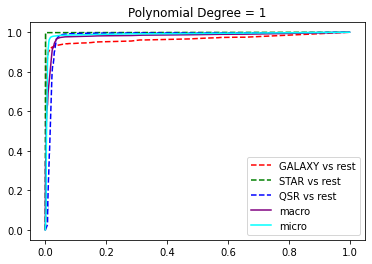

AUC (GALAXY vs rest)=  0.9644573356629057
AUC (STAR vs rest)=  0.9987293520603625
AUC (QSR vs rest)=  0.9791121022277665
AUC (macro avg)=  0.9807812020099392
AUC (micro avg)=  0.9885973672839508


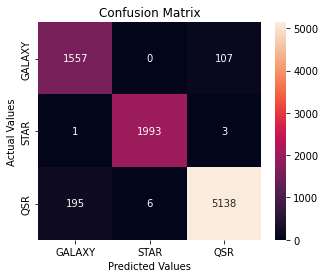

Train Accuracy =  0.9662
Validation Accuracy = 0.9563333333333334
              precision    recall  f1-score   support

           0       0.90      0.92      0.91      1664
           1       1.00      1.00      1.00      1997
           2       0.97      0.98      0.98      5339

   micro avg       0.96      0.98      0.97      9000
   macro avg       0.96      0.97      0.96      9000
weighted avg       0.96      0.98      0.97      9000
 samples avg       0.97      0.98      0.97      9000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning
/usr/local/lib/python3.7/dist-packages/seaborn/

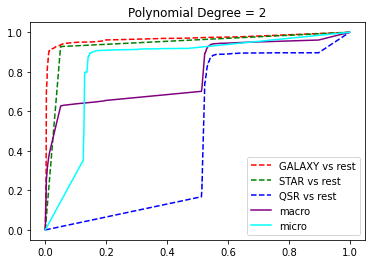

AUC (GALAXY vs rest)=  0.9673807563202543
AUC (STAR vs rest)=  0.9386773291452244
AUC (QSR vs rest)=  0.47751441606267936
AUC (macro avg)=  0.7946802299839584
AUC (micro avg)=  0.8406633672839507


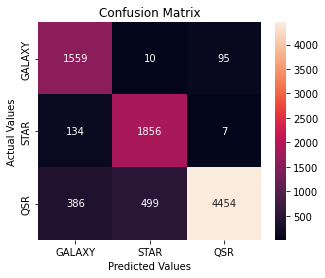

Train Accuracy =  0.9653
Validation Accuracy = 0.6601111111111111
              precision    recall  f1-score   support

           0       0.86      0.93      0.89      1664
           1       0.78      0.93      0.85      1997
           2       0.70      0.88      0.78      5339

   micro avg       0.74      0.90      0.81      9000
   macro avg       0.78      0.91      0.84      9000
weighted avg       0.75      0.90      0.82      9000
 samples avg       0.78      0.90      0.82      9000



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
from sklearn.tree import DecisionTreeClassifier
ret_values_dt = []
ret_values_dt.append(DT(Xtrain, ytrain, Xval, yval))

auc_ = plot_roc_auc(ret_values_dt[0]["fpr"],ret_values_dt[0]["tpr"])
plt.title("Polynomial Degree = 1")
plt.show()
print("AUC (GALAXY vs rest)= ", auc_[0])
print("AUC (STAR vs rest)= ", auc_[1])
print("AUC (QSR vs rest)= ", auc_[2])
print("AUC (macro avg)= ", auc_[3])
print("AUC (micro avg)= ", auc_[4])
plot_confusion_matrix(y_true=yval.argmax(axis=1), y_pred=ret_values_dt[0]["dt_y_pred"].argmax(axis=1))
print("Train Accuracy = ", ret_values_dt[0]["score_train"])
print("Validation Accuracy =", ret_values_dt[0]["score"])
print(classification_report(y_true=yval, y_pred=ret_values_dt[0]["dt_y_pred"]))

ret_values_dt.append(DT(Xtrain, ytrain, Xval, yval, poly_feature_obj=poly_2))
auc_ = plot_roc_auc(ret_values_dt[1]["fpr"],ret_values_dt[1]["tpr"])
plt.title("Polynomial Degree = 2")
plt.show()
print("AUC (GALAXY vs rest)= ", auc_[0])
print("AUC (STAR vs rest)= ", auc_[1])
print("AUC (QSR vs rest)= ", auc_[2])
print("AUC (macro avg)= ", auc_[3])
print("AUC (micro avg)= ", auc_[4])
plot_confusion_matrix(y_true=yval.argmax(axis=1), y_pred=ret_values_dt[1]["dt_y_pred"].argmax(axis=1))
print("Train Accuracy = ", ret_values_dt[1]["score_train"])
print("Validation Accuracy =", ret_values_dt[1]["score"])
print(classification_report(y_true=yval, y_pred=ret_values_dt[1]["dt_y_pred"]))

In [ ]:
import pickle
with open('ret_values_dt', 'wb') as f:
    pickle.dump(ret_values_dt, f)

#Deep Learning

In [ ]:
dfk =  pd.read_csv('/content/star_classification.csv')
cols=['obj_id','alpha','delta','ultraviolet_filter','green_filter','red_filter','near_infrared_filter','infrared_filter','run_id','rerun_id','cam_col','field_id','spec_obj_id','class','redshift','plate','MJD','fiber_id']
dfk.columns=cols

df4 = dfk.drop(columns=['obj_id', 'run_id', 'rerun_id', 'cam_col', 'field_id', 'MJD', 'fiber_id', 'infrared_filter','spec_obj_id', 'ultraviolet_filter','green_filter' ])

df4['class'].replace(['GALAXY', 'STAR', 'QSO'],
                        [0, 1, 2], inplace=True)

print(df4['class'].value_counts())





0    59445
1    21594
2    18961
Name: class, dtype: int64


In [ ]:
print('Columns to be cosidered: ', list(df4.columns))

Columns to be cosidered:  ['alpha', 'delta', 'red_filter', 'near_infrared_filter', 'class', 'redshift', 'plate']


In [ ]:
df4.head()

,alpha,delta,red_filter,near_infrared_filter,class,redshift,plate
0,135.689107,32.494632,20.39501,19.16573,0,0.634794,5812
1,144.826101,31.274185,22.58444,21.16812,0,0.779136,10445
2,142.188790,35.582444,20.60976,19.34857,0,0.644195,4576
3,338.741038,-0.402828,21.61162,20.50454,0,0.932346,9149
4,345.282593,21.183866,16.49747,15.97711,0,0.116123,6121


In [ ]:
df4.describe()

,alpha,delta,red_filter,near_infrared_filter,class,redshift,plate
count,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000,100000.000000
mean,177.629117,24.135305,19.645762,19.084854,0.595160,0.576661,5137.009660
std,96.502241,19.644665,1.854760,1.757895,0.787509,0.730707,2952.303351
min,0.005528,-18.785328,9.822070,9.469903,0.000000,-0.009971,266.000000
25%,127.518222,5.146771,18.135828,17.732285,0.000000,0.054517,2526.000000
50%,180.900700,23.645922,20.125290,19.405145,0.000000,0.424173,4987.000000
75%,233.895005,39.901550,21.044785,20.396495,1.000000,0.704154,7400.250000
max,359.999810,83.000519,29.571860,32.141470,2.000000,7.011245,12547.000000


In [ ]:
#Normalizing Data

for c in df4.drop(columns=['class']).columns:
  df4[c] = df4[c] /df4[c].abs().max()

In [ ]:
#Splitting Dataset 

train, test = train_test_split(df4, test_size=0.3, random_state=0)
test, val = train_test_split(test, test_size=0.3, random_state=0)
print(len(train), 'train examples')
print(len(val), 'validation examples')
print(len(test), 'test examples')

70000 train examples
9000 validation examples
21000 test examples


In [ ]:
def df_to_dataset(dataframe, shuffle=True, batch_size=32):
  dataframe = dataframe.copy()
  labels = dataframe.pop('class')
  ds = tf.data.Dataset.from_tensor_slices((dict(dataframe), labels))
  if shuffle:
    ds = ds.shuffle(buffer_size=len(dataframe))
  ds = ds.batch(batch_size)
  return ds

In [ ]:
batch_size = 32
train_ds = df_to_dataset(train, batch_size=batch_size)
val_ds = df_to_dataset(val, shuffle=False, batch_size=batch_size)
test_ds = df_to_dataset(test, shuffle=False, batch_size=batch_size)

In [ ]:
feature_columns = []

#numeric columns
for header in ['alpha', 'delta', 'red_filter', 'near_infrared_filter', 'redshift', 'plate']: 

  feature_columns.append(feature_column.numeric_column(header))

In [ ]:
model = 0

feature_layer = tf.keras.layers.DenseFeatures(feature_columns)

model = tf.keras.Sequential([
  feature_layer,
  layers.Dense(2046, activation='relu'),
  layers.Dense(1024, activation='relu'),
  layers.Dropout(0.2),
  layers.Dense(512, activation='relu'),
  layers.Dropout(0.1),
  layers.Dense(64, activation='relu'),
  layers.Dense(3, activation='softmax')
])


model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate=0.00035, amsgrad = True),
              loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits = True),
              metrics = ['accuracy'])

class_weight = {0: 1.,
                1: 2.5,
                2: 3.} 


In [ ]:
#Instead of training you can pass the weights file in the 4th block from this block

In [ ]:

his = model.fit (train_ds,
          validation_data = val_ds,
          epochs = 20,
          class_weight = class_weight)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_features (DenseFeatur  multiple                 0         
 es)                                                             
                                                                 
 dense (Dense)               multiple                  14322     
                                                                 
 dense_1 (Dense)             multiple                  2096128   
                                                                 
 dropout (Dropout)           multiple                  0         
                                                                 
 dense_2 (Dense)             multiple                  524800    
                                                                 
 dropout_1 (Dropout)         multiple                  0         
                                                        

Saving and Testing Model

In [ ]:
model.save_weights('/content/Model/weights.ckpt') #To save weights

In [ ]:
#To load weights

checkpoint_path = '/content/DNN_Model_Weights/weights.ckpt.data-00000-of-00001'
checkpoint_dir = os.path.dirname(checkpoint_path)

latest = tf.train.latest_checkpoint(checkpoint_dir)
latest

'/content/weights.ckpt'

In [ ]:
model.load_weights(latest)


Just to show previous progress, training for 2 epochs


In [ ]:
his1 = model.fit(train_ds,
          validation_data = val_ds,
          epochs = 2,
          class_weight = class_weight)

Epoch 1/2
2188/2188 [==============================] - 11s 5ms/step - loss: 0.2011 - accuracy: 0.9635 - val_loss: 0.1136 - val_accuracy: 0.9684
Epoch 2/2
2188/2188 [==============================] - 9s 4ms/step - loss: 0.1991 - accuracy: 0.9641 - val_loss: 0.1087 - val_accuracy: 0.9702


In [ ]:
print("Evaluate on test data")
results = model.evaluate(test_ds, batch_size=32)
print("test loss, test acc:", results)

Evaluate on test data
657/657 [==============================] - 2s 3ms/step - loss: 0.1162 - accuracy: 0.9657
test loss, test acc: [0.11618863046169281, 0.9657142758369446]


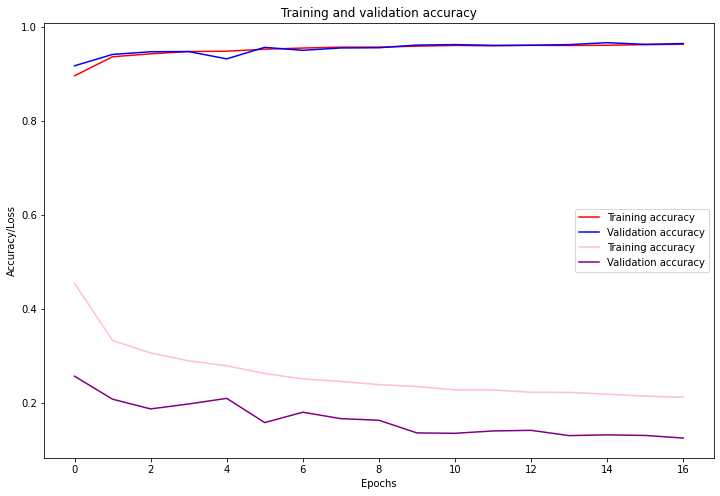

<Figure size 432x288 with 0 Axes>

In [ ]:
acc = his.history['accuracy']
val_acc = his.history['val_accuracy']
loss = his.history['loss']
val_loss = his.history['val_loss']

epochs = range(len(acc)-9)
plt.figure(figsize = (12,8))

plt.plot(epochs, acc[:-9], 'r', label='Training accuracy')
plt.plot(epochs, val_acc[:-9], 'b', label='Validation accuracy')


plt.plot(epochs, loss[:-9], 'pink', label='Training accuracy')
plt.plot(epochs, val_loss[:-9], 'purple', label='Validation accuracy')

plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy/Loss')
plt.legend(loc=0)


plt.show()
plt.savefig('/content/Plot/Train_curve.png')

In [ ]:
predictions = model.predict(test_ds)
y_pred= predictions.argmax(axis=-1)

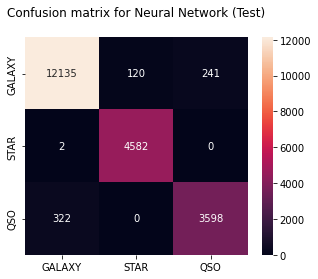

In [ ]:
cf = tf.math.confusion_matrix(
    test['class'],
    y_pred,
    num_classes=3,
    weights=None,
    dtype=tf.dtypes.int32,
    name=None
)

# cf = tf.math.confusion_matrix(
#     test['class'],
#     num_classes=3,
#     dtype=tf.dtypes.string,
#     weights=None)

plt.figure(figsize=(5,4))
ax = plt.axes()
ax.set_title('Confusion matrix for Neural Network (Test)\n')
sns.heatmap(cf, fmt = '0.5g' ,annot = True, ax = ax)
ax.xaxis.set_ticklabels(['GALAXY', 'STAR', 'QSO']); ax.yaxis.set_ticklabels(['GALAXY', 'STAR', 'QSO']);

plt.savefig('/content/Plot/CF_Test.jpg')

In [ ]:
predictions1 = model.predict(val_ds)
y_pred1= predictions1.argmax(axis=-1)


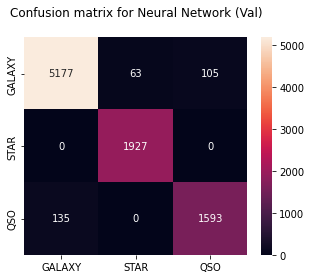

In [ ]:
cf1 = tf.math.confusion_matrix(
    val['class'],
    y_pred1,
    num_classes=3,
    weights=None,
    dtype=tf.dtypes.int32,
    name=None
)

plt.figure(figsize=(5,4))
ax = plt.axes()
ax.set_title('Confusion matrix for Neural Network (Val)\n')
sns.heatmap(cf1, fmt = '0.5g' ,annot=True, ax = ax)
ax.xaxis.set_ticklabels(['GALAXY', 'STAR', 'QSO']); ax.yaxis.set_ticklabels(['GALAXY', 'STAR', 'QSO']);

plt.savefig('/content/Plot/CF_Val.jpg')

In [ ]:
from sklearn.metrics import classification_report
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_curve, auc, roc_auc_score

In [ ]:
y_pred_n = np.where(y_pred == 0, 'GALAXY', y_pred)
y_pred_n = np.where(y_pred == 1, 'STAR', y_pred_n)
y_pred_n = np.where(y_pred == 2, 'QSO', y_pred_n)

In [ ]:
print(y_pred_n)

['GALAXY' 'QSO' 'GALAXY' ... 'GALAXY' 'GALAXY' 'GALAXY']


In [ ]:
class_report = classification_report(test['class'].replace([0,1,2],['GALAXY', 'STAR', 'QSO']), y_pred_n, labels=['GALAXY', 'STAR', 'QSO'])
print(class_report)

              precision    recall  f1-score   support

      GALAXY       0.97      0.97      0.97     12496
        STAR       0.97      1.00      0.99      4584
         QSO       0.94      0.92      0.93      3920

    accuracy                           0.97     21000
   macro avg       0.96      0.96      0.96     21000
weighted avg       0.97      0.97      0.97     21000



ROC AUC score: 0.9715019780944028


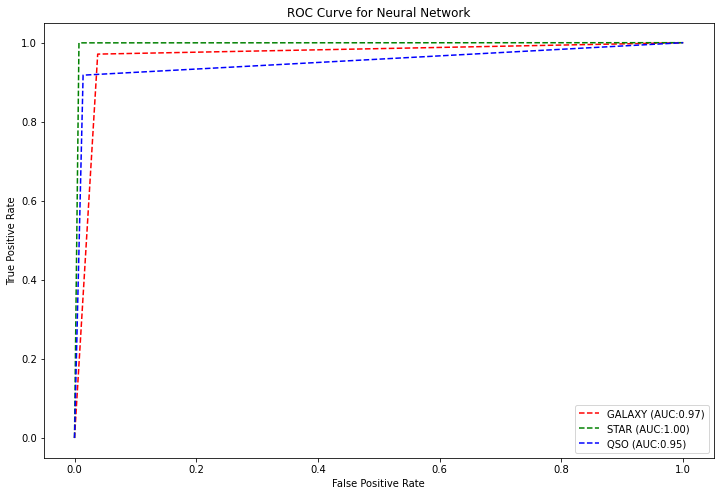

<Figure size 432x288 with 0 Axes>

In [ ]:
fig, c_ax = plt.subplots(1,1, figsize = (12, 8))

def multiclass_roc_auc_score(y_test, y_pred, target,average="macro"):
    lb = LabelBinarizer()
    lb.fit(y_test)
    y_test = lb.transform(y_test)
    y_pred = lb.transform(y_pred)
    color = ['r','g','b']
    for (idx, c_label) in enumerate(target):
        fpr, tpr, thresholds = roc_curve(y_test[:,idx].astype(int), y_pred[:,idx])
        c_ax.plot(fpr, tpr, label = '%s (AUC:%0.2f)'  % (c_label, auc(fpr, tpr)), color = color[idx], linestyle = '--')
    # c_ax.plot(fpr, fpr, 'b-', label = 'Random Guessing')
    return roc_auc_score(y_test, y_pred, average=average)

target = ['GALAXY','STAR','QSO']
print('ROC AUC score:', multiclass_roc_auc_score(val['class'], y_pred1  ,target))
plt.title("ROC Curve for Neural Network")
c_ax.legend()
c_ax.set_xlabel('False Positive Rate')
c_ax.set_ylabel('True Positive Rate')
plt.show()

plt.savefig('/content/Plot/ROC.png')